Esqueleto

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, HTML
from scipy.integrate import solve_ivp

%matplotlib inline

In [15]:
class Coupled_Oscillators:
    def __init__(self, N, m=1.0, k_springs=1.0, left_wall_k=0.0, right_wall_k=0.0):
        self.N = N
        self.M = self._build_mass_matrix(m)
        self.K = self._build_K_matrix(k_springs, left_wall_k, right_wall_k)
        # a matriz de massa e diagonal, por isso a inversa e so 1/diagonal
        self.Minv = np.diag(1.0 / np.diag(self.M))

    def _build_mass_matrix(self, m):
        # m pode ser um unico valor (massas iguais) ou um array com as N massas
        if np.isscalar(m):
            if m <= 0:
                raise ValueError("a massa tem de ser positiva")
            return np.diag(np.full(self.N, float(m)))
        m = np.asarray(m, dtype=float)
        if len(m) != self.N:
            raise ValueError(f"m deve ter {self.N} elementos")
        return np.diag(m)

    def _build_K_matrix(self, k_springs, left_wall_k, right_wall_k):
        # k_springs pode ser um valor (molas iguais) ou um array com as N-1 molas
        if np.isscalar(k_springs):
            k = np.full(self.N - 1, float(k_springs))
        else:
            k = np.asarray(k_springs, dtype=float)
            if len(k) != self.N - 1:
                raise ValueError(f"k_springs deve ter {self.N - 1} elementos")

        kL, kR = left_wall_k, right_wall_k
        if np.any(k <= 0) or kL < 0 or kR < 0:
            raise ValueError("as constantes das molas tem de ser positivas")

        # diagonal principal: soma das molas ligadas a cada massa (com paredes nos extremos)
        diag = np.empty(self.N)
        diag[0] = kL + k[0]
        diag[-1] = k[-1] + kR
        for i in range(1, self.N - 1):
            diag[i] = k[i - 1] + k[i]

        K = np.zeros((self.N, self.N))
        np.fill_diagonal(K, diag)
        # molas entre massas vizinhas (diagonais acima e abaixo)
        for i in range(self.N - 1):
            K[i, i + 1] = -k[i]
            K[i + 1, i] = -k[i]
        return K

    def _matrix_A(self):
        # passa o sistema de 2a ordem para 1a ordem: u' = A u, com u = [x, v]
        N = self.N
        zero = np.zeros((N, N))
        return np.block([[zero,                np.eye(N)],
                         [-self.Minv @ self.K, zero]])

    def solve_coupled_system_linear(self, x0=None, v0=None, t_max=50, num_points=1000):
        if x0 is None:
            x0 = np.zeros(self.N)
        if v0 is None:
            v0 = np.zeros(self.N)
        x0 = np.asarray(x0, dtype=float)
        v0 = np.asarray(v0, dtype=float)
        if len(x0) != self.N:
            raise ValueError(f"x0 tem de ter {self.N} elementos")

        A = self._matrix_A()
        u0 = np.concatenate([x0, v0])
        t = np.linspace(0, t_max, num_points)

        # metodo do scipy (RK45)
        sol = solve_ivp(lambda t, u: A @ u, (0, t_max), u0, t_eval=t, method='RK45')
        if not sol.success:
            raise RuntimeError(sol.message)
        sol_t, sol_u = sol.t, sol.y

        # metodo de Euler
        dt = t_max / (num_points - 1)
        sol_euler_u = np.zeros((2 * self.N, num_points))
        sol_euler_u[:, 0] = u0
        for i in range(num_points - 1):
            sol_euler_u[:, i + 1] = sol_euler_u[:, i] + dt * (A @ sol_euler_u[:, i])

        return sol_t, sol_u, t, sol_euler_u

    def solve_rk45(self, x0, v0, t_max=50, num_points=1000):
        # so o RK45, para quando nao precisamos da solucao de Euler
        A = self._matrix_A()
        u0 = np.concatenate([np.asarray(x0, dtype=float), np.asarray(v0, dtype=float)])
        t = np.linspace(0, t_max, num_points)
        sol = solve_ivp(lambda t, u: A @ u, (0, t_max), u0, t_eval=t, method='RK45')
        return sol.t, sol.y

    def normal_modes(self):
        # problema generalizado K eta = lambda M eta, com lambda = omega^2
        # como M e diagonal, passamos a um problema simetrico standard C y = lambda y,
        # com C = M^(-1/2) K M^(-1/2) e eta = M^(-1/2) y -> usamos numpy.linalg.eigh
        m = np.diag(self.M)
        M_half_inv = np.diag(1.0 / np.sqrt(m))
        C = M_half_inv @ self.K @ M_half_inv
        lambdas, ys = np.linalg.eigh(C)   # ja vem ordenado e com vetores ortonormais
        etas = M_half_inv @ ys            # modos normalizados a massa: eta^T M eta = 1
        omegas = np.sqrt(np.abs(lambdas))
        return omegas, etas

Método de Euler

Vamos testar os nossos métodos numa EDO simples com solução analítica conhecida:

$$\frac{dy}{dx} = xy, \quad y(1) = 0$$

A solução analítica é $y(t) = e^{\frac{x^2}{2}}$.

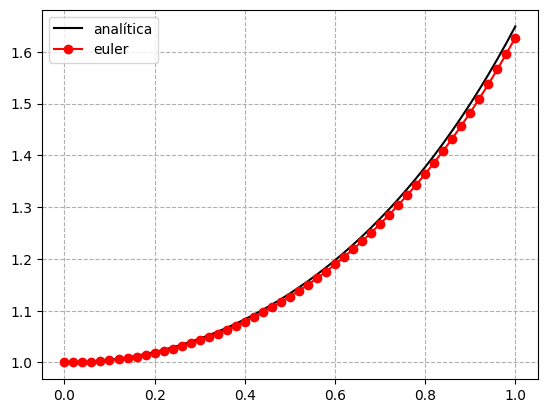

In [16]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]
def metodo_euler(f, t0, y0, t_final, h):
    """
    Resolver a EDO pelo método de Euler, para comparação
    f - a EDO que queremos resolver
    t0 - abcissa do ponto inicial
    y0 - ordenada do ponto inicial
    t_final - ordenada do ponto final
    h - passo, precisão de resolução
    """
    X = np.arange(t0, t_final + h, h)
    # Criação de um eixo das abcissas dividido por steps

    Y = np.zeros(len(X))
    # "Cópia" estrutural de do eixo criado

    Y[0] = y0
    # Ponto inicial a partir do qual vamos avaliar o método
    # Ou seja, precisamos de pelo menos um ponto que conhecemos ser uma solução
    
    for i in range(len(X) - 1):
        Y[i+1] = Y[i] + h * f(X[i], Y[i]) 
        # Fazer o contrário de uma derivada
        # Só funciona para EDO's

    return X, Y

def eq_dif(x, y):
    return x * y

def sol_analítica(x, y):
    return np.exp(x**2 / 2)

X = np.arange(0, 1 + 0.02, 0.02)
Y = sol_analítica(X, 0)

plt.plot(X, Y, label="analítica", c="black")

x_euler, y_euler = metodo_euler(eq_dif, 0, 1, 1, 0.02)
plt.plot(x_euler, y_euler, 'ro-', label='euler')
plt.legend()
plt.grid(True, ls="--")
plt.show()


Assumindo todas as massas iguais (escolhe um valor apropriado), todas as molas iguais
(escolhe um valor apropriado) e incluindo molas ligadas a paredes de ambos os lados, simule um
sistema com 5 massas. Como condições iniciais assume que todas as massas se encontram em
repouso e que apenas a massa no centro (m3) se encontra fora da posição de equilíbrio (por um
deslocamento que julgues adequado). Representa graficamente a posição de cada uma das massas
ao longo do tempo (considerar um tempo final que julgues apropriado). Compara as soluções
obtidas pelo método de Euler e pelo método implementado no scipy.integrate

Dica para o comentario: as duas solucoes coincidem no inicio e o Euler vai-se afastando do RK45 a medida que o tempo passa (o erro acumula).

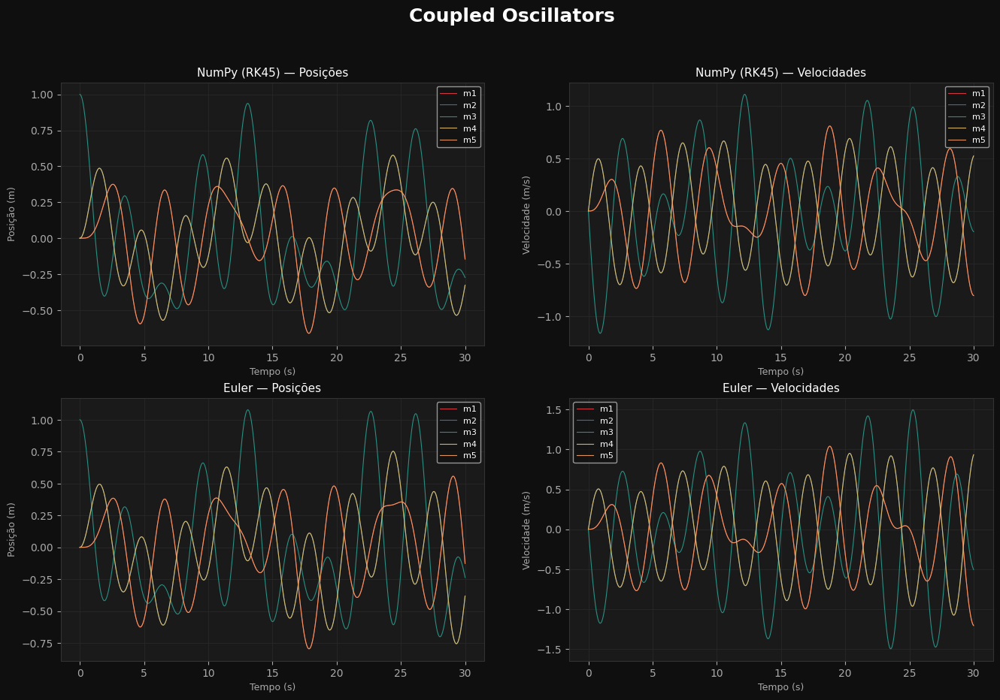

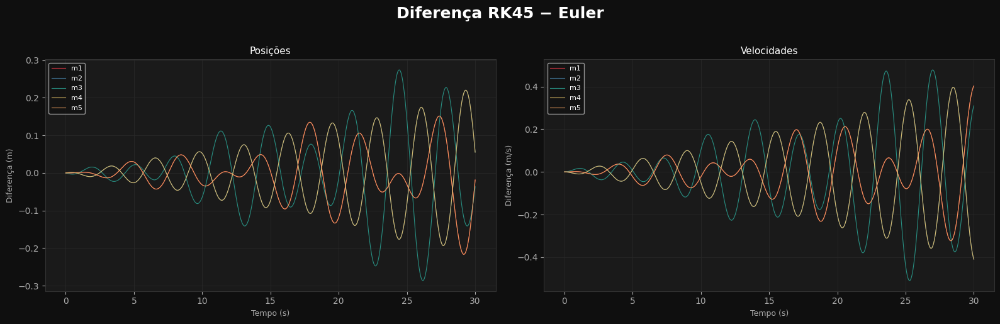

In [17]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]
N = 5
m_global = 1
k_global, k_right, k_left = 1, 1, 1
num_points = 3000
t_max = 30
initial_x = [0 for _ in range(N)]
initial_v = np.zeros_like(initial_x)
initial_x[2] = 1

sistema = Coupled_Oscillators(N, m_global, k_global, k_left, k_right)
sol_t_np, sol_u_np, sol_t_euler, sol_u_euler = sistema.solve_coupled_system_linear(initial_x, initial_v, t_max, num_points)

comparison = sol_u_np - sol_u_euler # Onde é que diferem e a partir de quando

# Extrair posições e velocidades
x_np    = sol_u_np[:N, :]
v_np    = sol_u_np[N:, :]
x_euler = sol_u_euler[:N, :]
v_euler = sol_u_euler[N:, :]

colors = ['#e63946', '#457b9d', '#2a9d8f', '#e9c46a', '#f4a261']
labels = [f'm{i+1}' for i in range(N)]

fig, axes = plt.subplots(2, 2, figsize=(16, 10), facecolor='#0f0f0f')
fig.suptitle('Coupled Oscillators', color='white', fontsize=18, fontweight='bold', y=0.98)

titles = [('NumPy (RK45) — Posições', 'Posição (m)'),
          ('NumPy (RK45) — Velocidades', 'Velocidade (m/s)'),
          ('Euler — Posições', 'Posição (m)'),
          ('Euler — Velocidades', 'Velocidade (m/s)')]

data = [(sol_t_np, x_np), (sol_t_np, v_np),
        (sol_t_euler, x_euler), (sol_t_euler, v_euler)]

for ax, (t, y), (title, ylabel) in zip(axes.flat, data, titles):
    ax.set_facecolor('#1a1a1a')
    for i in range(N):
        ax.plot(t, y[i, :], color=colors[i], label=labels[i], linewidth=0.8, alpha=0.9)
    ax.set_title(title, color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel(ylabel, color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)


x_diff = comparison[:N, :]
v_diff = comparison[N:, :]

fig2, axes2 = plt.subplots(1, 2, figsize=(16, 5), facecolor='#0f0f0f')
fig2.suptitle('Diferença RK45 − Euler', color='white', fontsize=18, fontweight='bold', y=1.02)

data_diff  = [(sol_t_np, x_diff, 'Posições', 'Diferença (m)'),
              (sol_t_np, v_diff, 'Velocidades', 'Diferença (m/s)')]

for ax, (t, y, title, ylabel) in zip(axes2.flat, data_diff):
    ax.set_facecolor('#1a1a1a')
    for i in range(N):
        ax.plot(t, y[i, :], color=colors[i], label=labels[i], linewidth=0.8, alpha=0.9)
    ax.set_title(title, color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel(ylabel, color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)


plt.tight_layout()
plt.show()

Repete a simulação com condições iniciais em que as massas estão todas em repouso, mas
em que estão todas deslocadas pela mesma distância para um lado. Existe alguma diferença com os resultados da alínea anterior? Comenta

Dica para o comentario: com paredes dos dois lados nao existe modo de translacao livre, por isso o sistema oscila a mesma em vez de deslizar em bloco (compara com a alinea anterior).

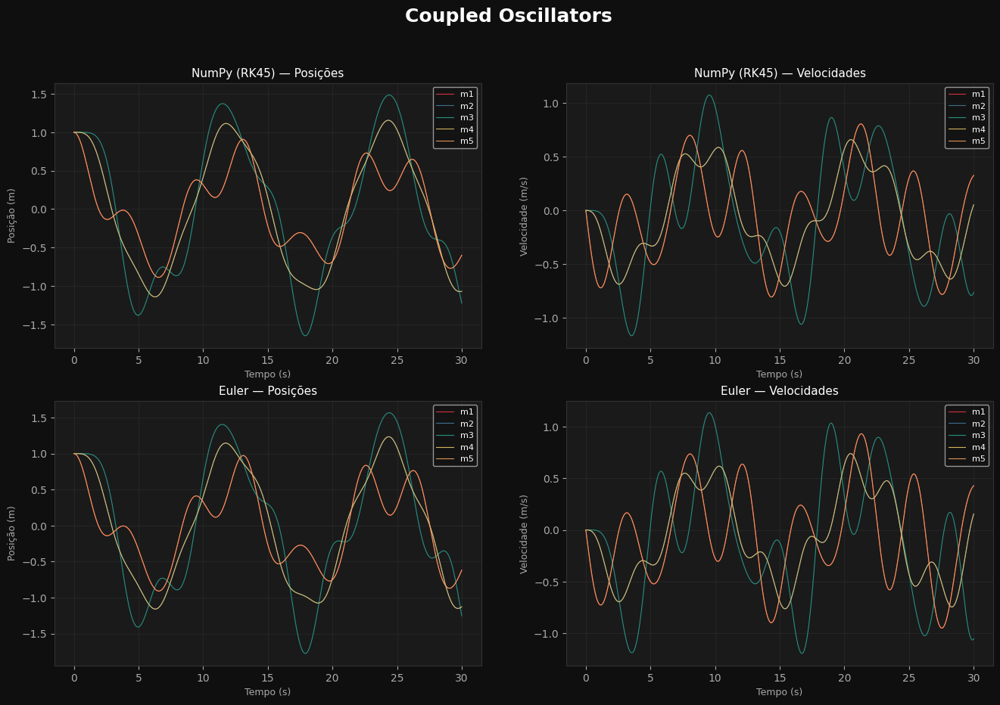

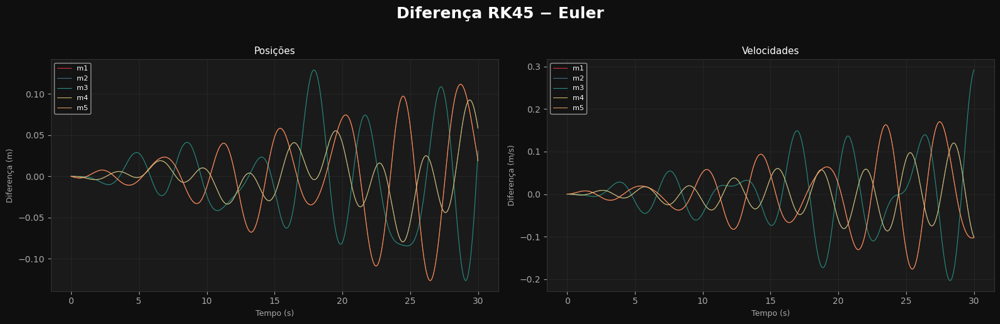

In [18]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]
N = 5
m_global = 1
k_global, k_right, k_left = 1, 1, 1
num_points = 3000
t_max = 30
initial_x = [1 for _ in range(N)]
initial_v = np.zeros_like(initial_x)

sistema = Coupled_Oscillators(N, m_global, k_global, k_left, k_right)
sol_t_np, sol_u_np, sol_t_euler, sol_u_euler = sistema.solve_coupled_system_linear(initial_x, initial_v, t_max, num_points)

comparison = sol_u_np - sol_u_euler # Onde é que diferem e a partir de quando

# Extrair posições e velocidades
x_np    = sol_u_np[:N, :]
v_np    = sol_u_np[N:, :]
x_euler = sol_u_euler[:N, :]
v_euler = sol_u_euler[N:, :]



colors = ['#e63946', '#457b9d', '#2a9d8f', '#e9c46a', '#f4a261']
labels = [f'm{i+1}' for i in range(N)]

fig, axes = plt.subplots(2, 2, figsize=(16, 10), facecolor='#0f0f0f')
fig.suptitle('Coupled Oscillators', color='white', fontsize=18, fontweight='bold', y=0.98)

titles = [('NumPy (RK45) — Posições', 'Posição (m)'),
          ('NumPy (RK45) — Velocidades', 'Velocidade (m/s)'),
          ('Euler — Posições', 'Posição (m)'),
          ('Euler — Velocidades', 'Velocidade (m/s)')]

data = [(sol_t_np, x_np), (sol_t_np, v_np),
        (sol_t_euler, x_euler), (sol_t_euler, v_euler)]

for ax, (t, y), (title, ylabel) in zip(axes.flat, data, titles):
    ax.set_facecolor('#1a1a1a')
    for i in range(N):
        ax.plot(t, y[i, :], color=colors[i], label=labels[i], linewidth=0.8, alpha=0.9)
    ax.set_title(title, color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel(ylabel, color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)


x_diff = comparison[:N, :]
v_diff = comparison[N:, :]

fig2, axes2 = plt.subplots(1, 2, figsize=(16, 5), facecolor='#0f0f0f')
fig2.suptitle('Diferença RK45 − Euler', color='white', fontsize=18, fontweight='bold', y=1.02)

data_diff  = [(sol_t_np, x_diff, 'Posições', 'Diferença (m)'),
              (sol_t_np, v_diff, 'Velocidades', 'Diferença (m/s)')]

for ax, (t, y, title, ylabel) in zip(axes2.flat, data_diff):
    ax.set_facecolor('#1a1a1a')
    for i in range(N):
        ax.plot(t, y[i, :], color=colors[i], label=labels[i], linewidth=0.8, alpha=0.9)
    ax.set_title(title, color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel(ylabel, color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)


plt.tight_layout()
plt.show()

A energia cinética é dada por:
$$T(t) = \frac{1}{2}\sum^{N}_{i=1}m_i \dot{x}_i^2(t) = \frac{1}{2}\bold{v}^T(t)\bold{M}\bold{v}(t)$$
A energia potencial é dada por:
$$V(t) = \frac{1}{2}k_L\dot{x}_1^2(t)+\frac{1}{2}\sum_{i=1}^{N-1}k_{i,i+1}(x_{i+1}(t)-x_i(t))^2 + \frac{1}{2}k_R x_N^2(t) = \frac{1}{2}\bold{x}^T(t)\bold{Kx}(t)$$

Represente graficamente a evoluçaõ no tempo da energia cinética $T$, da energia potencial $V$, e da energia mecânica total $E = T + V$. Sabendo que a energia total é conservada, compare a precisão dos dois métodos usados para reslver as equaç~çoes diferenciais. 
Em princípio o método que conserva melhor a energia mecância total será o que tem mais precisão.

Vamos aplicá-lo à simulação corrida anteriormente.

Dica para o comentario: ver qual metodo mantem E = T + V mais constante. O que conserva melhor a energia e o mais preciso (espera-se Euler a divergir e RK45 quase constante).

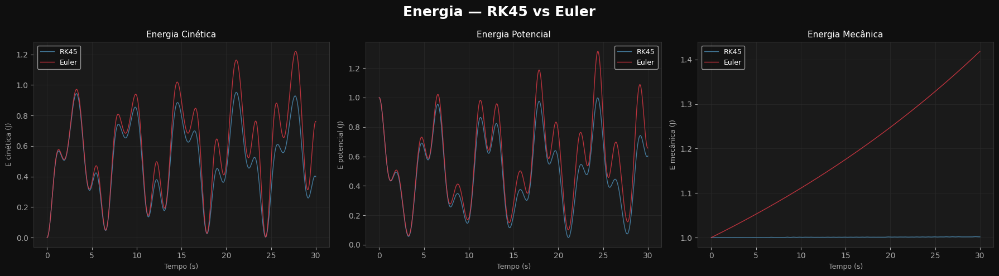

In [19]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]
def kinetic(vel, M):
    # T = 1/2 v^T M v calculado para todos os instantes de uma vez (vel tem shape (N, num_points))
    return 0.5 * np.sum(vel * (M @ vel), axis=0)

def potencial(pos, K):
    # V = 1/2 x^T K x para todos os instantes
    return 0.5 * np.sum(pos * (K @ pos), axis=0)

np_potencial = potencial(x_np, sistema.K)
np_kinetic = kinetic(v_np, sistema.M)
np_mec = np_potencial + np_kinetic

euler_potencial = potencial(x_euler, sistema.K)
euler_kinetic = kinetic(v_euler, sistema.M)
euler_mec = euler_potencial + euler_kinetic

fig3, axes3 = plt.subplots(1, 3, figsize=(18, 5), facecolor='#0f0f0f')
fig3.suptitle('Energia — RK45 vs Euler', color='white', fontsize=18, fontweight='bold')

energy_data = [
    (np_kinetic,   euler_kinetic,   'Energia Cinética',   'E cinética (J)'),
    (np_potencial, euler_potencial, 'Energia Potencial',  'E potencial (J)'),
    (np_mec,       euler_mec,       'Energia Mecânica',   'E mecânica (J)'),
]

for ax, (e_np, e_euler, title, ylabel) in zip(axes3, energy_data):
    ax.set_facecolor('#1a1a1a')
    ax.plot(sol_t_np, e_np,    color='#457b9d', label='RK45',  linewidth=1.0)
    ax.plot(sol_t_np, e_euler, color='#e63946', label='Euler', linewidth=1.0, alpha=0.8)
    ax.set_title(title, color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel(ylabel, color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=9, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)

plt.tight_layout()
plt.show()



Modos normais

Os modos normais sao as solucoes em que todas as massas oscilam com a mesma frequencia. Como as solucoes sao harmonicas, o sistema da Eq. 3 transforma-se num problema de valores proprios:

$$M^{-1}K\,\eta_j = \lambda_j\,\eta_j, \qquad \lambda_j = \omega_j^2$$

Os vetores proprios $\eta_j$ sao os modos normais e $\omega_j = \sqrt{\lambda_j}$ as frequencias proprias. Acrescentamos o metodo `normal_modes` a classe, que usa o `numpy.linalg`. Como $M$ e diagonal, reescrevemos o problema na forma simetrica $C\,y = \lambda\,y$ com $C = M^{-1/2} K M^{-1/2}$, resolvido com `numpy.linalg.eigh` (frequencias ordenadas e modos com $\eta_j^T M \eta_j = 1$).

Para cada modo, o movimento das massas e $x_i(t) = \eta_{ij}\cos(\omega_j t)$. Representamos cada modo num plot separado, com a trajetoria de todas as massas.

Frequencias proprias:
  modo 1: omega = 0.5176
  modo 2: omega = 1.0000
  modo 3: omega = 1.4142
  modo 4: omega = 1.7321
  modo 5: omega = 1.9319


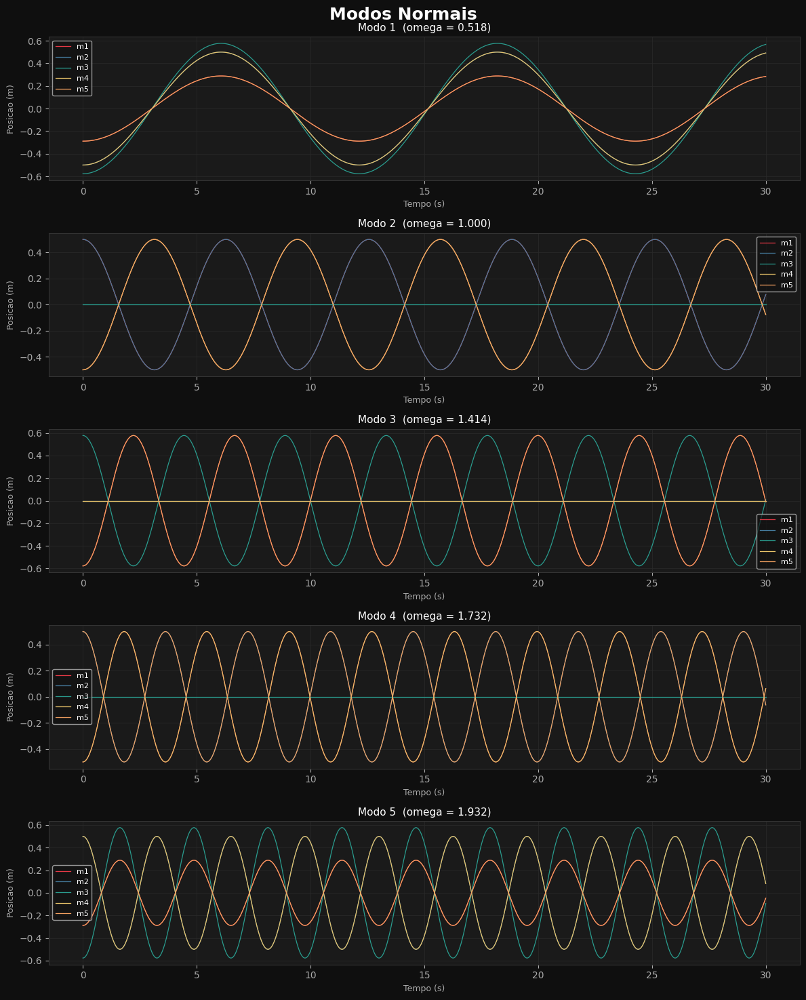

In [20]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]
# Parte 3a - modos normais
N = 5
m_global = 1
k_global, k_right, k_left = 1, 1, 1

sistema = Coupled_Oscillators(N, m_global, k_global, k_left, k_right)
omegas, modos = sistema.normal_modes()

print("Frequencias proprias:")
for j in range(N):
    print(f"  modo {j+1}: omega = {omegas[j]:.4f}")

# movimento das massas em cada modo: x_i(t) = eta_ij * cos(omega_j * t)
t = np.linspace(0, 30, 1000)

colors = ['#e63946', '#457b9d', '#2a9d8f', '#e9c46a', '#f4a261']
labels = [f'm{i+1}' for i in range(N)]

fig, axes = plt.subplots(N, 1, figsize=(12, 15), facecolor='#0f0f0f')
fig.suptitle('Modos Normais', color='white', fontsize=18, fontweight='bold')

for j in range(N):
    ax = axes[j]
    ax.set_facecolor('#1a1a1a')
    for i in range(N):
        xi = modos[i, j] * np.cos(omegas[j] * t)
        ax.plot(t, xi, color=colors[i], label=labels[i], linewidth=0.9)
    ax.set_title(f'Modo {j+1}  (omega = {omegas[j]:.3f})', color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel('Posicao (m)', color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)

plt.tight_layout()
plt.show()

Sobreposicao de modos normais

Qualquer solucao do sistema pode ser escrita como uma sobreposicao linear dos modos normais:

$$x(t) = \sum_{j=1}^{N}\left[\left(\eta_j^T M x_0\right)\cos(\omega_j t) + \left(\frac{\eta_j^T M v_0}{\omega_j}\right)\sin(\omega_j t)\right]\eta_j$$

Usamos as mesmas condicoes iniciais da parte 2a (todas as massas em repouso e so a massa do meio deslocada) e comparamos esta reconstrucao com a solucao numerica obtida na parte 1 (RK45).

Dica para o comentario: as duas curvas devem sobrepor-se quase na perfeicao; a pequena diferenca vem so do erro numerico do RK45.

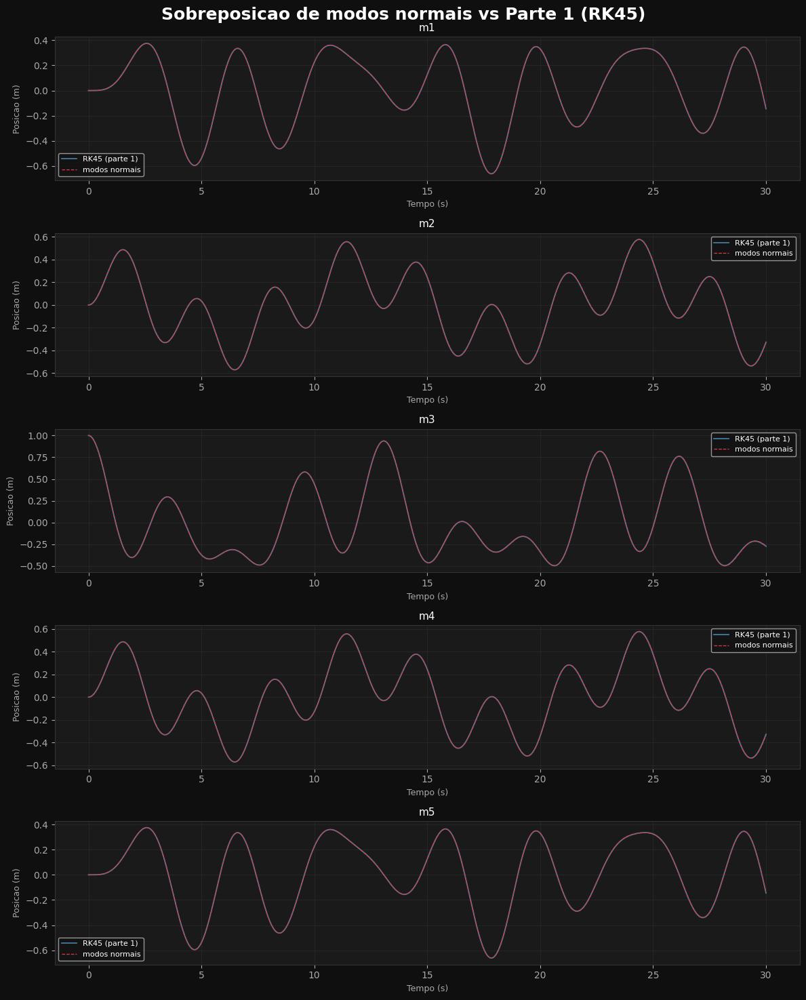

Diferenca maxima entre RK45 e sobreposicao de modos: 5.10e-03


In [21]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]
# Parte 3b - solucao por sobreposicao dos modos normais
N = 5
m_global = 1
k_global, k_right, k_left = 1, 1, 1
t_max = 30
num_points = 3000

x0 = np.zeros(N)
x0[2] = 1          # so a massa do meio fora do equilibrio
v0 = np.zeros(N)

sistema = Coupled_Oscillators(N, m_global, k_global, k_left, k_right)
omegas, modos = sistema.normal_modes()

# solucao da parte 1 para comparar
sol_t_np, sol_u_np = sistema.solve_rk45(x0, v0, t_max, num_points)
x_np = sol_u_np[:N, :]
t = sol_t_np

# reconstruir x(t) somando a contribuicao de cada modo
x_modos = np.zeros((N, len(t)))
for j in range(N):
    eta = modos[:, j]
    a = eta @ sistema.M @ x0            # coeficiente do cosseno
    b = (eta @ sistema.M @ v0) / omegas[j]   # coeficiente do seno
    temporal = a * np.cos(omegas[j] * t) + b * np.sin(omegas[j] * t)
    x_modos += np.outer(eta, temporal)

colors = ['#e63946', '#457b9d', '#2a9d8f', '#e9c46a', '#f4a261']

fig, axes = plt.subplots(N, 1, figsize=(12, 15), facecolor='#0f0f0f')
fig.suptitle('Sobreposicao de modos normais vs Parte 1 (RK45)', color='white', fontsize=18, fontweight='bold')

for i in range(N):
    ax = axes[i]
    ax.set_facecolor('#1a1a1a')
    ax.plot(t, x_np[i, :], color='#457b9d', label='RK45 (parte 1)', linewidth=1.3)
    ax.plot(t, x_modos[i, :], color='#e63946', label='modos normais', linewidth=0.9, ls='--')
    ax.set_title(f'm{i+1}', color='white', fontsize=11)
    ax.set_xlabel('Tempo (s)', color='#aaaaaa', fontsize=9)
    ax.set_ylabel('Posicao (m)', color='#aaaaaa', fontsize=9)
    ax.tick_params(colors='#aaaaaa')
    ax.spines[:].set_color('#333333')
    ax.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.7)
    ax.grid(True, color='#2a2a2a', linewidth=0.5)

plt.tight_layout()
plt.show()

# diferenca maxima entre os dois metodos
print(f"Diferenca maxima entre RK45 e sobreposicao de modos: {np.abs(x_np - x_modos).max():.2e}")

Nesta secção estuda-se como a presença de molas ligadas às paredes afecta o espectro de frequências próprias de uma cadeia de osciladores acoplados. Para isso, simula-se um sistema com massas e molas internas iguais, fazendo variar a constante kwall das molas das extremidades desde um caso sem paredes (kwall = 0) até paredes progressivamente mais rígidas, e analisa-se o conjunto das frequências próprias ωⱼ obtidas em cada caso, com particular atenção ao modo fundamental ω₁

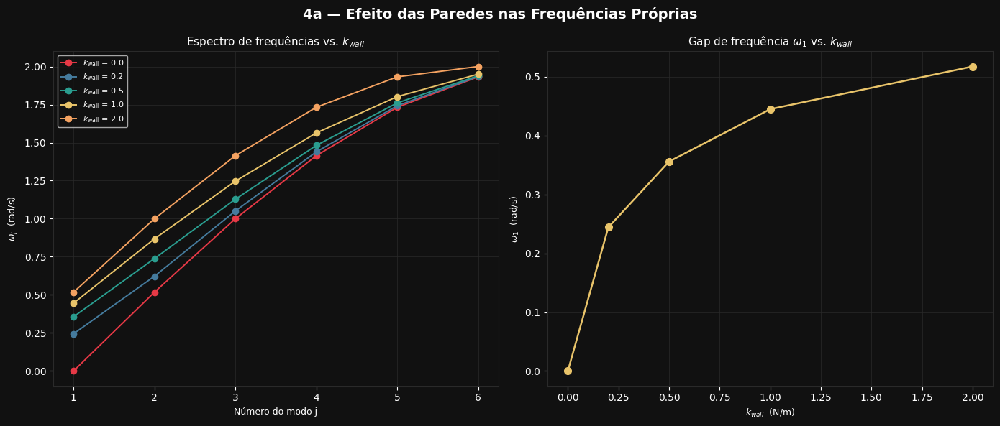

Verifica-se que, sem paredes, o modo de menor frequência tem ω₁ = 0, correspondendo a uma translação rígida de toda a cadeia, 
não havendo força restauradora que se oponha a um deslocamento global do sistema. Ao aumentar kwall, esse modo deixa de ser 
livre e a sua frequência sobe progressivamente, abrindo um gap na parte inferior do espectro, enquanto os modos superiores, 
dominados pelo acoplamento interno, se mantêm praticamente inalterados. As paredes funcionam assim como um mecanismo de ancoragem
do sistema, fixando uma posição de equilíbrio bem definida e eliminando a degenerescência associada à invariância translacional.


In [22]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]

def style_ax(ax, title='', xlabel='Tempo (s)', ylabel=''):
    ax.set_facecolor('#111111')
    ax.set_title(title, color='white', fontsize=11)
    ax.set_xlabel(xlabel, color='#ffffff', fontsize=9)
    ax.set_ylabel(ylabel, color='#ffffff', fontsize=9)
    ax.tick_params(colors='#ffffff')
    for sp in ax.spines.values(): sp.set_color('#2a2a2a')
    ax.grid(True, color='#2a2a2a', linewidth=0.5)

N = 6
k_spring = 1.0
kwall_values = [0.0, 0.2, 0.5, 1.0, 2.0]

fig, axes = plt.subplots(1, 2, figsize=(14, 6), facecolor='#111111')
fig.suptitle('4a — Efeito das Paredes nas Frequências Próprias',
             color='white', fontsize=14, fontweight='bold')

ax_freq = axes[0]
ax_gap  = axes[1]

for idx, kw in enumerate(kwall_values):
    sistema = Coupled_Oscillators(N, m=1.0, k_springs=k_spring,
                                  left_wall_k=kw, right_wall_k=kw)
    omegas, _ = sistema.normal_modes()
    label = f'$k_\\mathrm{{wall}}$ = {kw}'
    ax_freq.plot(range(1, N+1), omegas,
                 'o-', color=PALETTE[idx], label=label, linewidth=1.4,
                 markersize=6)

style_ax(ax_freq, title='Espectro de frequências vs. $k_{wall}$',
         xlabel='Número do modo j', ylabel='$\\omega_j$  (rad/s)')
ax_freq.set_xticks(range(1, N+1))
ax_freq.legend(fontsize=8, facecolor='#111111', labelcolor='white', framealpha=0.8)

# Gap = ω₁ em função de kwall
gaps = []
for kw in kwall_values:
    s = Coupled_Oscillators(N, m=1.0, k_springs=k_spring,
                            left_wall_k=kw, right_wall_k=kw)
    w, _ = s.normal_modes()
    gaps.append(w[0])

ax_gap.plot(kwall_values, gaps, 'o-', color='#e9c46a', linewidth=1.8, markersize=7)
style_ax(ax_gap, title='Gap de frequência $\\omega_1$ vs. $k_{wall}$',
         xlabel='$k_{wall}$  (N/m)', ylabel='$\\omega_1$  (rad/s)')

plt.tight_layout()
plt.show()

print("""Verifica-se que, sem paredes, o modo de menor frequência tem ω₁ = 0, correspondendo a uma translação rígida de toda a cadeia, 
não havendo força restauradora que se oponha a um deslocamento global do sistema. Ao aumentar kwall, esse modo deixa de ser 
livre e a sua frequência sobe progressivamente, abrindo um gap na parte inferior do espectro, enquanto os modos superiores, 
dominados pelo acoplamento interno, se mantêm praticamente inalterados. As paredes funcionam assim como um mecanismo de ancoragem
do sistema, fixando uma posição de equilíbrio bem definida e eliminando a degenerescência associada à invariância translacional.""")

Pretende-se investigar como a relação entre as frequências próprias e o número de modo evolui com o tamanho do sistema. Para isso, simula-se uma cadeia de massas iguais ligadas por molas iguais, sem paredes, para vários valores crescentes de N, e representam-se num mesmo gráfico as frequências ωⱼ em função do número de modo normalizado j/(N+1), sobrepondo a curva analítica ω(q) = 2√(k/m) |sin(qπ/2)| para comparação.

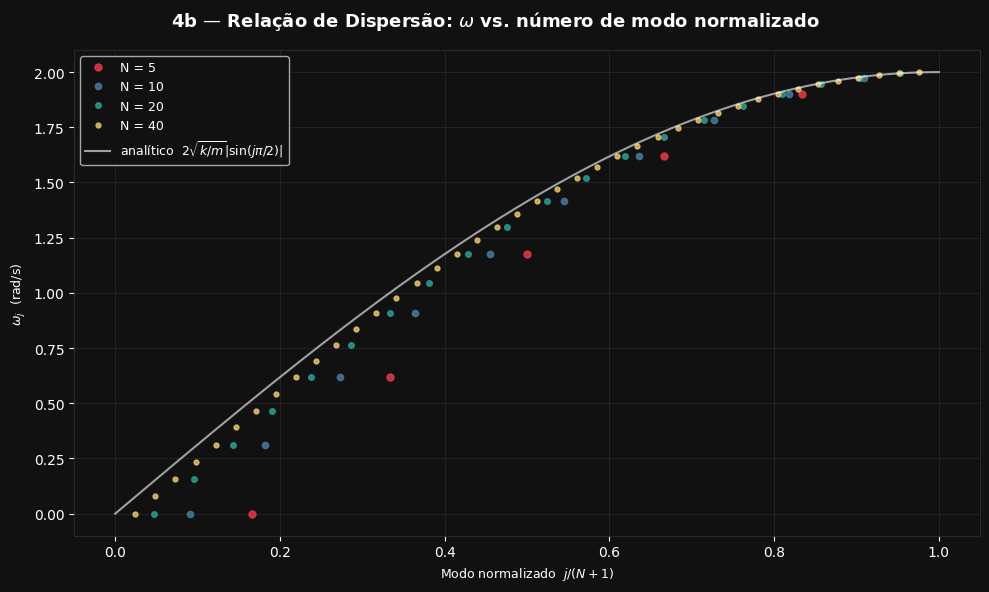

Os resultados mostram que as frequências próprias se distribuem sempre sobre a mesma curva sinusoidal, 
independentemente do valor de N — o que muda é apenas a densidade de pontos ao longo dessa curva. 
Para N pequeno, os modos amostram a relação de dispersão de forma grosseira; para N grande, os pontos preenchem-na 
quase continuamente, tornando-se difícil distinguir o sistema discreto do seu limite contínuo. Observa-se ainda o regime 
acústico (ω ∝ j) para modos de baixa frequência e a saturação em ω_max = 2√(k/m) junto ao topo da banda, onde massas vizinhas 
oscilam em oposição de fase. Esta estrutura é o análogo mecânico das bandas fonónicas em redes cristalinas, ilustrando como 
propriedades colectivas universais emergem a partir de um conjunto finito de osciladores acoplados.


In [23]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]

fig, ax = plt.subplots(figsize=(10, 6), facecolor='#111111')
fig.suptitle('4b — Relação de Dispersão: $\\omega$ vs. número de modo normalizado',
             color='white', fontsize=13, fontweight='bold')

N_values = [5, 10, 20, 40]
k, m_val = 1.0, 1.0

for idx, N in enumerate(N_values):
    sistema = Coupled_Oscillators(N, m=m_val, k_springs=k)
    omegas, _ = sistema.normal_modes()
    # número de modo normalizado: j/(N+1) ∈ (0, 1)
    j_norm = np.arange(1, N+1) / (N + 1)
    ax.plot(j_norm, omegas, 'o', color=PALETTE[idx], label=f'N = {N}',
            markersize=5 - idx*0.5, alpha=0.85)

# Curva analítica contínua
q_cont = np.linspace(0, 1, 500)
omega_cont = 2 * np.sqrt(k / m_val) * np.abs(np.sin(np.pi * q_cont / 2))
ax.plot(q_cont, omega_cont, '-', color='white', linewidth=1.5,
        label='analítico  $2\\sqrt{k/m}|\\sin(j\\pi/2)|$', alpha=0.6)

style_ax(ax, title='', xlabel='Modo normalizado  $j/(N+1)$',
         ylabel='$\\omega_j$  (rad/s)')
ax.legend(fontsize=9, facecolor='#111111', labelcolor='white', framealpha=0.8)

plt.tight_layout()
plt.show()

print("""Os resultados mostram que as frequências próprias se distribuem sempre sobre a mesma curva sinusoidal, 
independentemente do valor de N — o que muda é apenas a densidade de pontos ao longo dessa curva. 
Para N pequeno, os modos amostram a relação de dispersão de forma grosseira; para N grande, os pontos preenchem-na 
quase continuamente, tornando-se difícil distinguir o sistema discreto do seu limite contínuo. Observa-se ainda o regime 
acústico (ω ∝ j) para modos de baixa frequência e a saturação em ω_max = 2√(k/m) junto ao topo da banda, onde massas vizinhas 
oscilam em oposição de fase. Esta estrutura é o análogo mecânico das bandas fonónicas em redes cristalinas, ilustrando como 
propriedades colectivas universais emergem a partir de um conjunto finito de osciladores acoplados.""")

Nesta secção substitui-se a lei de Hooke por uma força com termo cúbico adicional, F = −k·Δx − α·Δx³, em cada mola, de modo a estudar os efeitos da anarmonicidade no comportamento de uma cadeia de osciladores. Simula-se um sistema com 5 massas, molas iguais e paredes em ambos os lados, partindo da massa central deslocada e as restantes em repouso, para vários valores de α (incluindo α = 0 como referência). Analisam-se as trajectórias das massas, a conservação da energia mecânica total e a dependência da frequência efectiva da massa central em função da amplitude inicial.

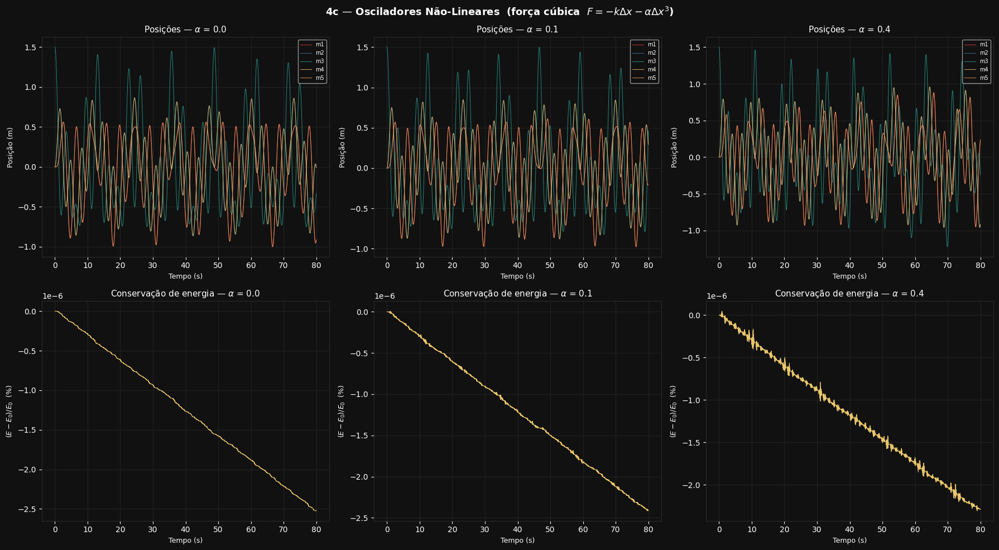

   (frequência vs amplitude...)


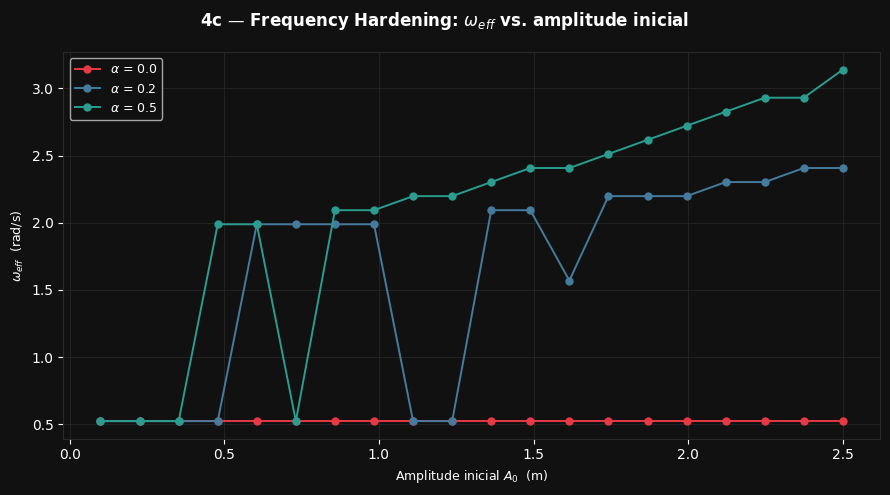

Para α = 0 recupera-se o caso linear, com trajectórias periódicas e modos normais desacoplados. 
Para α > 0, observa-se que (i) a frequência efectiva de oscilação aumenta com a amplitude inicial — fenómeno de frequency hardening 
característico das molas duras —, evidenciando que o conceito de frequência própria deixa de ser independente da condição inicial; (ii) 
excitar apenas uma massa já não produz movimento estritamente periódico, surgindo trocas de energia entre modos e o aparecimento de 
batimentos quasi-periódicos; (iii) apesar da não-linearidade, a energia mecânica total mantém-se conservada até à precisão do integrador, 
confirmando que o sistema continua a ser Hamiltoniano (o potencial V = ½kΔx² + ¼αΔx⁴ é conservativo). Estes resultados ilustram, num caso 
simples, o tipo de fenómenos que estão na origem do célebre problema de Fermi–Pasta–Ulam–Tsingou.


In [24]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]

def solve_nonlinear(N, m, k, alpha, x0, v0, t_max, num_points, kL=1.0, kR=1.0):
    """Resolve o sistema com força F = -k·Δx - α·Δx³ via RK45."""
    M_inv = np.full(N, 1.0 / m)  # massas iguais

    def dudt(t, u):
        x = u[:N]
        v = u[N:]
        F = np.zeros(N)

        # Mola esquerda (parede → massa 0)
        dx = x[0]
        F[0] -= kL * dx + alpha * dx**3

        # Molas internas
        for i in range(N - 1):
            dx = x[i+1] - x[i]
            f_lin = k * dx + alpha * dx**3
            F[i]   += f_lin
            F[i+1] -= f_lin

        # Mola direita (massa N-1 → parede)
        dx = x[N-1]
        F[N-1] -= kR * dx + alpha * dx**3

        dxdt = v
        dvdt = M_inv * F
        return np.concatenate([dxdt, dvdt])

    u0 = np.concatenate([x0, v0])
    t_eval = np.linspace(0, t_max, num_points)
    sol = solve_ivp(dudt, (0, t_max), u0, t_eval=t_eval,
                    method='RK45', rtol=1e-9, atol=1e-12)
    return sol.t, sol.y
N = 5
m_val, k_val = 1.0, 1.0
t_max, num_pts = 80, 5000
x0 = np.zeros(N); x0[2] = 1.5   # amplitude maior para realçar não-linearidade
v0 = np.zeros(N)

alphas = [0.0, 0.1, 0.4]
labels_alpha = [f'$\\alpha$ = {a}' for a in alphas]

# Energia mecânica: T + V não-linear
def energy_nonlinear(t_arr, u, m, k, alpha, kL, kR, N):
    x = u[:N, :]
    v = u[N:, :]
    T = 0.5 * m * np.sum(v**2, axis=0)
    V = np.zeros(len(t_arr))
    # mola esquerda
    V += 0.5 * kL * x[0]**2 + alpha/4 * x[0]**4
    # molas internas
    for i in range(N-1):
        dx = x[i+1] - x[i]
        V += 0.5 * k * dx**2 + alpha/4 * dx**4
    # mola direita
    V += 0.5 * kR * x[N-1]**2 + alpha/4 * x[N-1]**4
    return T, V, T + V

fig, axes = plt.subplots(2, 3, figsize=(18, 10), facecolor='#111111')
fig.suptitle('4c — Osciladores Não-Lineares  (força cúbica  $F = -k\\Delta x - \\alpha\\Delta x^3$)',
             color='white', fontsize=13, fontweight='bold')

for col, (alpha, lbl) in enumerate(zip(alphas, labels_alpha)):
    t_arr, u = solve_nonlinear(N, m_val, k_val, alpha, x0.copy(), v0.copy(),
                               t_max, num_pts)
    x_sol = u[:N, :]

    T, V, E = energy_nonlinear(t_arr, u, m_val, k_val, alpha, 1.0, 1.0, N)
    E0 = E[0]

    # Linha superior: trajectórias das massas
    ax_pos = axes[0, col]
    ax_pos.set_facecolor('#111111')
    for i in range(N):
        ax_pos.plot(t_arr, x_sol[i], color=PALETTE[i],
                    label=f'm{i+1}', linewidth=0.7, alpha=0.85)
    style_ax(ax_pos, title=f'Posições — {lbl}',
             xlabel='Tempo (s)', ylabel='Posição (m)')
    ax_pos.legend(fontsize=7, facecolor='#111111', labelcolor='white', framealpha=0.7)

    # Linha inferior: desvio relativo da energia total
    ax_en = axes[1, col]
    ax_en.set_facecolor('#111111')
    rel_err = (E - E0) / E0
    ax_en.plot(t_arr, rel_err * 100, color='#e9c46a', linewidth=0.8)
    style_ax(ax_en, title=f'Conservação de energia — {lbl}',
             xlabel='Tempo (s)', ylabel='$(E - E_0)/E_0$  (%)')

plt.tight_layout()
plt.show()

# Gráfico extra: frequência de oscilação da massa central vs amplitude inicial
print("   (frequência vs amplitude...)")
alphas_cmp = [0.0, 0.2, 0.5]
amplitudes = np.linspace(0.1, 2.5, 20)

fig2, ax2 = plt.subplots(figsize=(9, 5), facecolor='#111111')
fig2.suptitle('4c — Frequency Hardening: $\\omega_{eff}$ vs. amplitude inicial',
              color='white', fontsize=12, fontweight='bold')

for idx, alpha in enumerate(alphas_cmp):
    freqs = []
    for A0 in amplitudes:
        x0_a = np.zeros(N); x0_a[2] = A0
        t_a, u_a = solve_nonlinear(N, m_val, k_val, alpha, x0_a, v0.copy(),
                                   60, 3000)
        # Estimar frequência dominante por FFT na massa central
        x_center = u_a[2, :]
        dt = t_a[1] - t_a[0]
        fft = np.abs(np.fft.rfft(x_center))
        freqs_fft = np.fft.rfftfreq(len(x_center), d=dt) * 2 * np.pi
        dominant = freqs_fft[np.argmax(fft[1:]) + 1]
        freqs.append(dominant)
    ax2.plot(amplitudes, freqs, 'o-', color=PALETTE[idx],
             label=f'$\\alpha$ = {alpha}', linewidth=1.4, markersize=5)

style_ax(ax2, title='', xlabel='Amplitude inicial $A_0$  (m)',
         ylabel='$\\omega_{eff}$  (rad/s)')
ax2.legend(fontsize=9, facecolor='#111111', labelcolor='white', framealpha=0.8)

plt.tight_layout()
plt.show()

print("""Para α = 0 recupera-se o caso linear, com trajectórias periódicas e modos normais desacoplados. 
Para α > 0, observa-se que (i) a frequência efectiva de oscilação aumenta com a amplitude inicial — fenómeno de frequency hardening 
característico das molas duras —, evidenciando que o conceito de frequência própria deixa de ser independente da condição inicial; (ii) 
excitar apenas uma massa já não produz movimento estritamente periódico, surgindo trocas de energia entre modos e o aparecimento de 
batimentos quasi-periódicos; (iii) apesar da não-linearidade, a energia mecânica total mantém-se conservada até à precisão do integrador, 
confirmando que o sistema continua a ser Hamiltoniano (o potencial V = ½kΔx² + ¼αΔx⁴ é conservativo). Estes resultados ilustram, num caso 
simples, o tipo de fenómenos que estão na origem do célebre problema de Fermi–Pasta–Ulam–Tsingou.""")

Para complementar a análise feita através dos gráficos de posição vs. tempo, constrói-se uma animação do movimento da cadeia, em que cada massa é representada por um círculo na sua posição instantânea e as molas por segmentos que ligam massas vizinhas e as extremidades às paredes. Usa-se o sistema linear com 5 massas, molas iguais e paredes em ambos os lados, partindo da massa central deslocada e as restantes em repouso, com um tempo final escolhido para permitir observar várias reflexões.

In [27]:
if "PALETTE" not in dir(): PALETTE = ["#e63946", "#457b9d", "#2a9d8f", "#e9c46a", "#f4a261"]

N = 5
sistema_anim = Coupled_Oscillators(N, m=1.0, k_springs=1.0,
                                   left_wall_k=1.0, right_wall_k=1.0)
x0_anim = np.zeros(N); x0_anim[2] = 1.0
v0_anim = np.zeros(N)
t_anim, u_anim, _, _ = sistema_anim.solve_coupled_system_linear(x0_anim, v0_anim,
                                                                 t_max=30, num_points=1500)
x_anim = u_anim[:N, :]   # (N, num_points)

# Posições de equilíbrio (equidistantes em y=0)
x_eq = np.linspace(-2, 2, N)

fig_anim = plt.figure(figsize=(12, 4), facecolor='#111111')
ax_anim = fig_anim.add_subplot(111, facecolor='#111111')

ax_anim.set_xlim(-3.0, 3.0)
ax_anim.set_ylim(-0.8, 0.8)
ax_anim.set_aspect('equal')
ax_anim.tick_params(colors='#ffffff')
for sp in ax_anim.spines.values(): sp.set_color('#2a2a2a')
ax_anim.set_title('Animação dos osciladores acoplados', color='white', fontsize=11)
ax_anim.set_xlabel('Posição (m)', color='#ffffff', fontsize=9)
ax_anim.set_yticks([])

# Paredes
ax_anim.axvline(-3.0, color='#888888', linewidth=3)
ax_anim.axvline( 3.0, color='#888888', linewidth=3)

# Objetos animados: círculos (massas) e linhas (molas)
circles = [plt.Circle((x_eq[i], 0), 0.18, color=PALETTE[i], zorder=5)
           for i in range(N)]
for c in circles:
    ax_anim.add_patch(c)

# Linhas das molas (incluindo ligação às paredes)
spring_lines = []
for _ in range(N + 1):
    ln, = ax_anim.plot([], [], '-', color='#888888', linewidth=1.2, zorder=3)
    spring_lines.append(ln)

time_text = ax_anim.text(-2.8, 0.6, '', color='white', fontsize=9)

def init_anim():
    for c, xe in zip(circles, x_eq):
        c.center = (xe, 0)
    for ln in spring_lines:
        ln.set_data([], [])
    time_text.set_text('')
    return circles + spring_lines + [time_text]

def update_anim(frame):
    x_now = x_eq + x_anim[:, frame]   # posição actual = equilíbrio + deslocamento

    for i, c in enumerate(circles):
        c.center = (x_now[i], 0)

    # Mola: parede esquerda → massa 0
    spring_lines[0].set_data([-3.0, x_now[0]], [0, 0])
    # Molas internas
    for i in range(N - 1):
        spring_lines[i+1].set_data([x_now[i], x_now[i+1]], [0, 0])
    # Mola: massa N-1 → parede direita
    spring_lines[N].set_data([x_now[N-1], 3.0], [0, 0])

    time_text.set_text(f't = {t_anim[frame]:.2f} s')
    return circles + spring_lines + [time_text]

# Saltar de 5 em 5 frames para velocidade razoável
step = 5
frames = range(0, len(t_anim), step)
ani = animation.FuncAnimation(fig_anim, update_anim, frames=frames,
                               init_func=init_anim, blit=True, interval=30)

plt.close()

display(HTML(ani.to_jshtml(default_mode='loop')))

print("""A animação torna visualmente intuitiva a dinâmica espacial do sistema: a perturbação propaga-se simetricamente a partir 
da massa central, reflecte-se nas paredes e regressa ao centro, num comportamento análogo ao de uma onda numa corda fixa nos dois 
extremos. Para tempos suficientemente longos, as múltiplas reflexões sobrepõem-se e o movimento perde a aparência de uma única onda 
viajante, dando lugar a um padrão complexo de batimentos resultante da interferência entre os vários modos normais excitados. 
Fica assim ilustrada, de forma directa, a ideia de que qualquer movimento da cadeia é, em última análise, uma sobreposição dos seus 
modos próprios, cada um com a sua frequência e o seu perfil espacial característico.""")

A animação torna visualmente intuitiva a dinâmica espacial do sistema: a perturbação propaga-se simetricamente a partir 
da massa central, reflecte-se nas paredes e regressa ao centro, num comportamento análogo ao de uma onda numa corda fixa nos dois 
extremos. Para tempos suficientemente longos, as múltiplas reflexões sobrepõem-se e o movimento perde a aparência de uma única onda 
viajante, dando lugar a um padrão complexo de batimentos resultante da interferência entre os vários modos normais excitados. 
Fica assim ilustrada, de forma directa, a ideia de que qualquer movimento da cadeia é, em última análise, uma sobreposição dos seus 
modos próprios, cada um com a sua frequência e o seu perfil espacial característico.
